# Group Assignment 3 - Aydin

Project Focus: Park Equity In LA County: Supervisorial Districts 2 and 5

Group: Miles Kim Parr, Aydin Pasebani, Annie Chan, Max Garcia, and Rodrigo Gutierrez

Research Question: “What is the correlation between access to parks and green space and community health in LA County?”

Data Sources: Cal Enviro Screen, Census Tracts Data for LA County in 2020, Supervisorial District 2 & 5 Boundaries, Park Needs Assessment

My Task: Community Health / Park Needs

# Step 1: "Clean Notebook"

In [1]:
import pandas as pd
import geopandas as gpd

In [2]:
csv_file_path = 'data/ces4.0.csv'
ces = pd.read_csv('data/ces4.0.csv')

In [5]:
ces.shape

(2343, 8)

In [6]:
ces.head()

,FIPS,Total Population,California County,ZIP,Approximate Location,Longitude,Latitude,CES 4.0 Score
0,6037204920,2751,Los Angeles,90023,Los Angeles,-118.197497,34.017500,82.39
1,6037542402,3306,Los Angeles,90221,Compton,-118.212413,33.881969,80.71
2,6037543202,5124,Los Angeles,90220,Compton,-118.230032,33.879862,79.29
3,6037203300,2000,Los Angeles,90033,Los Angeles,-118.207788,34.058872,77.35
4,6037291220,3640,Los Angeles,90247,Los Angeles,-118.286709,33.877139,77.25


In [7]:
import pandas as pd
ces = pd.read_csv('data/ces4.0.csv', dtype={'Census Tract': str})
ces['FIPS'] = ces['FIPS'].astype(str).str.zfill(11)

In [8]:
ces.head(5)

,FIPS,Total Population,California County,ZIP,Approximate Location,Longitude,Latitude,CES 4.0 Score
0,06037204920,2751,Los Angeles,90023,Los Angeles,-118.197497,34.017500,82.39
1,06037542402,3306,Los Angeles,90221,Compton,-118.212413,33.881969,80.71
2,06037543202,5124,Los Angeles,90220,Compton,-118.230032,33.879862,79.29
3,06037203300,2000,Los Angeles,90033,Los Angeles,-118.207788,34.058872,77.35
4,06037291220,3640,Los Angeles,90247,Los Angeles,-118.286709,33.877139,77.25


In [9]:
district5 = pd.read_csv('data/district5.csv',
    dtype =
    {
        'CT20':str,
    }
)
district5

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,1,1,1,101110,1011.10,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.676519e+06,5565.411341
1,2,1,2,101122,1011.22,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3.881001e+06,11695.304280
2,3,1,3,101220,1012.20,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.025452e+06,4688.607147
3,4,1,4,101221,1012.21,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,5.197057e+05,3378.824327
4,5,1,5,101222,1012.22,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,4.350619e+05,3685.233312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,2468,2,2468,980009,9800.09,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,Metro Planning Area,3.111583e+07,29917.249730
444,2479,1,2479,980020,9800.20,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.251160e+07,22316.623370
445,2480,2,2480,980021,9800.21,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.019501e+07,18963.319730
446,2485,1,2485,980026,9800.26,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,1,San Fernando Valley Planning Area,2.040772e+07,37925.072330


In [10]:
district5['FIPS'] = '06' + '037' + district5['CT20']
district5.head()

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length,FIPS
0,1,1,1,101110,1011.10,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.676519e+06,5565.411341,06037101110
1,2,1,2,101122,1011.22,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3.881001e+06,11695.304280,06037101122
2,3,1,3,101220,1012.20,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1.025452e+06,4688.607147,06037101220
3,4,1,4,101221,1012.21,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,5.197057e+05,3378.824327,06037101221
4,5,1,5,101222,1012.22,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,4.350619e+05,3685.233312,06037101222


In [12]:
tracts = gpd.read_file('data/census_tracts.geojson')

In [13]:
tracts['FIPS'] ='06' + '037' + tracts['CT20']

In [14]:
tracts.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,FIPS
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222


In [15]:
tracts_ces= tracts.merge(ces, on = "FIPS")

In [16]:
tracts_ces.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total Population,California County,ZIP,Approximate Location,Longitude,Latitude,CES 4.0 Score
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,4283,Los Angeles,91042,Los Angeles,-118.292987,34.259474,23.81
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,3405,Los Angeles,91042,Los Angeles,-118.290147,34.267721,13.17
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,3702,Los Angeles,91042,Los Angeles,-118.281632,34.251609,30.64
3,6,101300,1013.00,2.777377e+07,29384.860602,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",06037101300,3884,Los Angeles,91042,Los Angeles,-118.270999,34.248778,19.86
4,7,101400,1014.00,6.791532e+07,42668.928986,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",06037101400,3458,Los Angeles,91042,Los Angeles,-118.294163,34.242853,27.07


<Axes: >

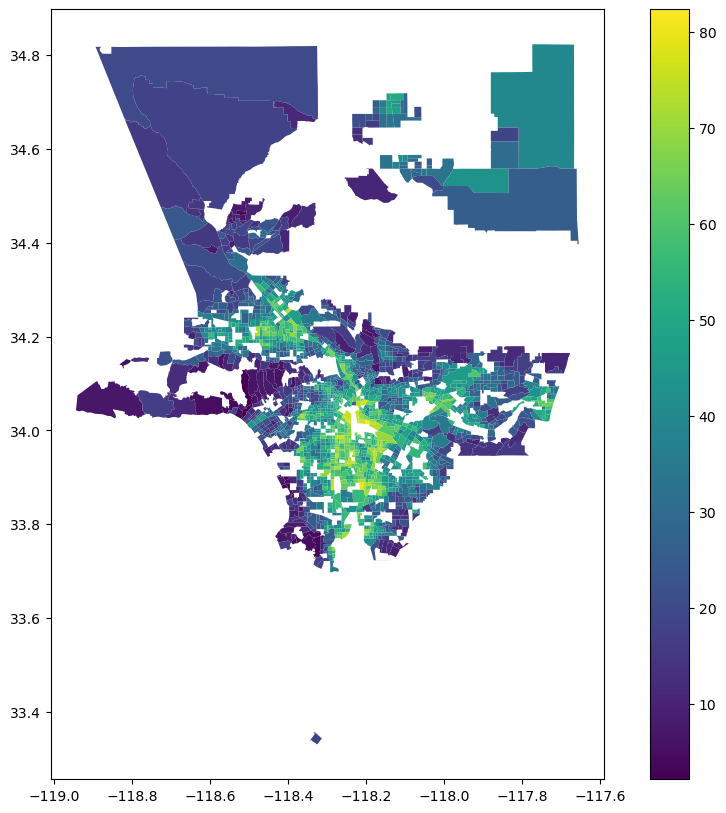

In [17]:
tracts_ces.plot(figsize=(12,10),
                 column='CES 4.0 Score',
                 legend=True, 
                 )

In [18]:
tracts_ces.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2018 entries, 0 to 2017
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              2018 non-null   int64   
 1   CT20                  2018 non-null   object  
 2   LABEL                 2018 non-null   object  
 3   ShapeSTArea           2018 non-null   float64 
 4   ShapeSTLength         2018 non-null   float64 
 5   geometry              2018 non-null   geometry
 6   FIPS                  2018 non-null   object  
 7   Total Population      2018 non-null   int64   
 8   California County     2018 non-null   object  
 9   ZIP                   2018 non-null   int64   
 10  Approximate Location  2018 non-null   object  
 11  Longitude             2018 non-null   float64 
 12  Latitude              2018 non-null   float64 
 13  CES 4.0 Score         1987 non-null   float64 
dtypes: float64(5), geometry(1), int64(3), object(5)


In [19]:
district5ces= tracts_ces.merge(district5, on="FIPS")

In [20]:
district5ces.head()

,OBJECTID,CT20_x,LABEL_x,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total Population,California County,ZIP,...,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,4283,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1676518.629,5565.411341
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,3405,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3881000.543,11695.304280
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,3702,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1025452.086,4688.607147
3,6,101300,1013.00,2.777377e+07,29384.860602,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",06037101300,3884,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3786000.676,10858.706120
4,7,101400,1014.00,6.791532e+07,42668.928986,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",06037101400,3458,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,9256640.508,15739.594220


In [21]:
district5ces.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 341 entries, 0 to 340
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              341 non-null    int64   
 1   CT20_x                341 non-null    object  
 2   LABEL_x               341 non-null    object  
 3   ShapeSTArea           341 non-null    float64 
 4   ShapeSTLength         341 non-null    float64 
 5   geometry              341 non-null    geometry
 6   FIPS                  341 non-null    object  
 7   Total Population      341 non-null    int64   
 8   California County     341 non-null    object  
 9   ZIP                   341 non-null    int64   
 10  Approximate Location  341 non-null    object  
 11  Longitude             341 non-null    float64 
 12  Latitude              341 non-null    float64 
 13  CES 4.0 Score         331 non-null    float64 
 14  OBJECTID_12           341 non-null    int64   
 15

In [22]:
district5ces.head()

,OBJECTID,CT20_x,LABEL_x,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total Population,California County,ZIP,...,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,4283,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1676518.629,5565.411341
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,3405,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3881000.543,11695.304280
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,3702,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,1025452.086,4688.607147
3,6,101300,1013.00,2.777377e+07,29384.860602,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",06037101300,3884,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,3786000.676,10858.706120
4,7,101400,1014.00,6.791532e+07,42668.928986,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",06037101400,3458,Los Angeles,91042,...,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,NaN,INCORPORATED CITY,3,San Fernando Valley Planning Area,9256640.508,15739.594220


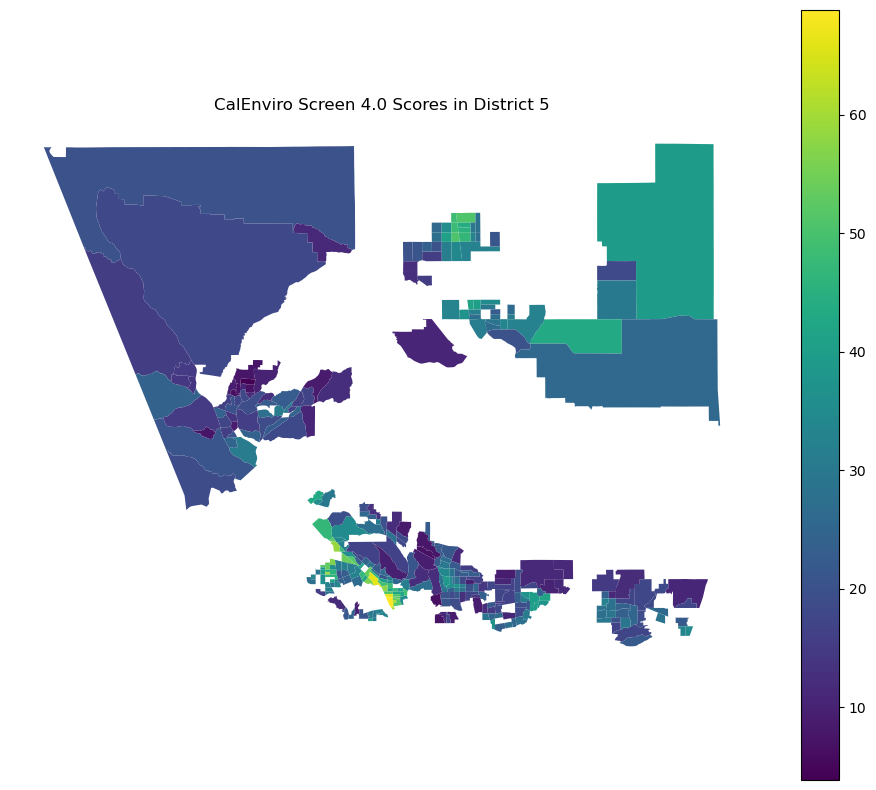

In [24]:
import matplotlib.pyplot as plt
ax= district5ces.plot(figsize=(12,10),
                 column='CES 4.0 Score',
                 legend=True, )
ax.set_title('CalEnviro Screen 4.0 Scores in District 5')
ax.axis('off')
plt.show()

In [25]:
district2 = pd.read_csv('data/district2.csv',
    dtype =
    {
        'CT20':str,
    }
)
district2

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,640,2,640,211000,2110.00,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,5,Westside Planning Area,3.881413e+06,9270.888577
1,641,2,641,211121,2111.21,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,3.125745e+05,2799.117227
2,642,3,642,211122,2111.22,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,5.341218e+05,3050.487937
3,643,2,643,211123,2111.23,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,2.513022e+05,2501.035059
4,644,2,644,211124,2111.24,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,5.771177e+05,3012.923477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,2484,1,2484,980025,9800.25,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,CARSON,NaN,INCORPORATED CITY,10,South Bay Planning Area,5.660027e+06,12364.180850
502,2486,1,2486,980028,9800.28,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,5,Westside Planning Area,2.867719e+07,31517.576850
503,2487,1,2487,980030,9800.30,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,EL SEGUNDO,NaN,INCORPORATED CITY,5,South Bay Planning Area,7.606368e+06,12791.712010
504,2493,2,2493,980037,9800.37,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,CARSON,NaN,INCORPORATED CITY,11,South Bay Planning Area,1.891289e+06,5551.732493


In [26]:
district2['FIPS'] = '06' + '037' + district2['CT20']
district2.head()

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length,FIPS
0,640,2,640,211000,2110.00,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,5,Westside Planning Area,3.881413e+06,9270.888577,06037211000
1,641,2,641,211121,2111.21,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,3.125745e+05,2799.117227,06037211121
2,642,3,642,211122,2111.22,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,5.341218e+05,3050.487937,06037211122
3,643,2,643,211123,2111.23,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,2.513022e+05,2501.035059,06037211123
4,644,2,644,211124,2111.24,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,5.771177e+05,3012.923477,06037211124


In [27]:
district2ces = tracts_ces.merge(district2, on="FIPS")

In [28]:
district2ces.head()

,OBJECTID,CT20_x,LABEL_x,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total Population,California County,ZIP,...,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,640,211000,2110.00,2.859668e+07,25170.331758,"POLYGON ((-118.32268 34.07621, -118.32355 34.0...",06037211000,5124,Los Angeles,90020,...,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,5,Westside Planning Area,3.881413e+06,9270.888577
1,641,211121,2111.21,2.302636e+06,7588.943500,"POLYGON ((-118.28435 34.07045, -118.28435 34.0...",06037211121,2253,Los Angeles,90004,...,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,3.125745e+05,2799.117227
2,642,211122,2111.22,3.934734e+06,8274.051868,"POLYGON ((-118.29051 34.07633, -118.29170 34.0...",06037211122,3163,Los Angeles,90004,...,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,5.341218e+05,3050.487937
3,645,211201,2112.01,1.500116e+06,4915.797811,"POLYGON ((-118.29657 34.07631, -118.29697 34.0...",06037211201,2562,Los Angeles,90004,...,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,2.036427e+05,1811.419313
4,646,211202,2112.02,1.928501e+06,5559.519694,"POLYGON ((-118.29170 34.07633, -118.29297 34.0...",06037211202,2239,Los Angeles,90004,...,2ND SUP. DISTRICT,2ND DISTRICT: HOLLY MITCHELL,2,LOS ANGELES,NaN,INCORPORATED CITY,9,Metro Planning Area,2.617965e+05,2048.091994


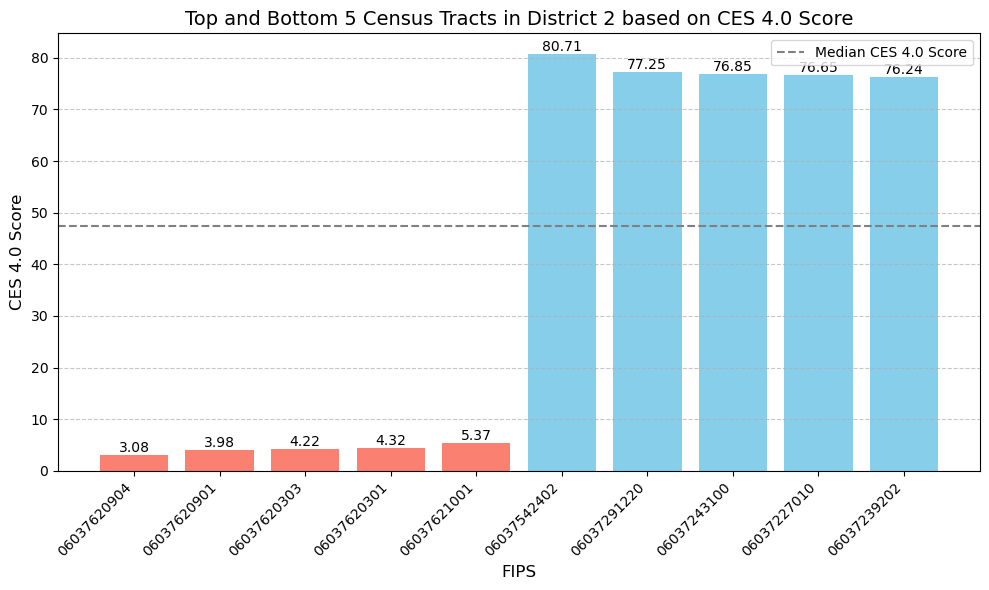

In [30]:
import matplotlib.pyplot as plt
median_score = district2ces['CES 4.0 Score'].median()
lowest_scores = district2ces.sort_values(by='CES 4.0 Score').head(5)
highest_scores = district2ces.sort_values(by='CES 4.0 Score', ascending=False).head(5)
top_bottom_scores = pd.concat([lowest_scores, highest_scores])
plt.figure(figsize=(10, 6))
colors = ['skyblue' if score >= median_score else 'salmon' for score in top_bottom_scores['CES 4.0 Score']]
bars = plt.bar(top_bottom_scores['FIPS'], top_bottom_scores['CES 4.0 Score'], color=colors)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02, f'{bar.get_height():.2f}', ha='center', va='bottom')
plt.axhline(y=median_score, color='gray', linestyle='--', label='Median CES 4.0 Score')
plt.xlabel('FIPS', fontsize=12)
plt.ylabel('CES 4.0 Score', fontsize=12)
plt.title('Top and Bottom 5 Census Tracts in District 2 based on CES 4.0 Score', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

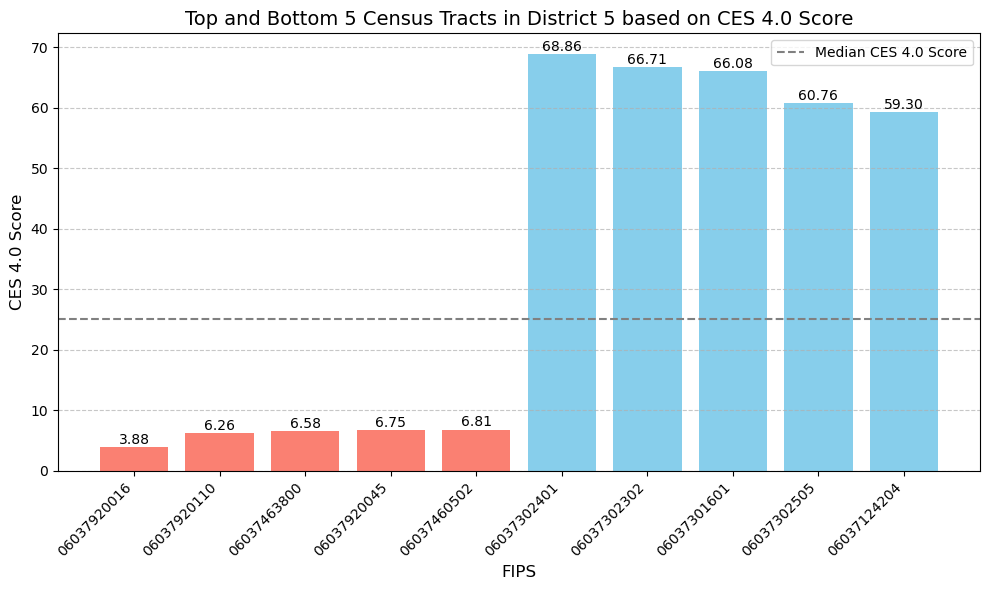

In [31]:
import matplotlib.pyplot as plt
lowest_scores_district5 = district5ces.sort_values(by='CES 4.0 Score').head(5)
highest_scores_district5 = district5ces.sort_values(by='CES 4.0 Score', ascending=False).head(5)
top_bottom_scores_district5 = pd.concat([lowest_scores_district5, highest_scores_district5])
median_score_district5 = district5ces['CES 4.0 Score'].median()
plt.figure(figsize=(10, 6))
colors_district5 = ['skyblue' if score >= median_score_district5 else 'salmon' for score in top_bottom_scores_district5['CES 4.0 Score']]
bars_district5 = plt.bar(top_bottom_scores_district5['FIPS'], top_bottom_scores_district5['CES 4.0 Score'], color=colors_district5)
for bar_district5 in bars_district5:
    plt.text(bar_district5.get_x() + bar_district5.get_width() / 2, bar_district5.get_height() + 0.02, f'{bar_district5.get_height():.2f}', ha='center', va='bottom')
plt.axhline(y=median_score_district5, color='gray', linestyle='--', label='Median CES 4.0 Score')
plt.xlabel('FIPS', fontsize=12)
plt.ylabel('CES 4.0 Score', fontsize=12)
plt.title('Top and Bottom 5 Census Tracts in District 5 based on CES 4.0 Score', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

The lower the score, the less environmental and socioeconomic vulnerability

In [32]:
pna = gpd.read_file('data/pna.geojson')

In [33]:
pna.head()

,OBJECTID,STUD_AR_ID,STUD_AR_NM,DESCRIPT,DISTRICT,POP_10,POP_14,STUD_AR_LBL,TOOLKIT_ID,Acres,FINAL,MapLoc,AC_PER_1K,RepPrkAc,NEED_DESCP,PCT_Walk,SHAPE_Length,SHAPE_Area,Total_Annual_Allocations,geometry
0,1,129,City of LA Brentwood - Pacific Palisades,City of Los Angeles Planning Area (Unchanged),3,57060.0,58098,City of LA Brentwood - Pacific Palisades,129,24319.323463,3,South County,6.523099,378.979,Moderate,29.704955,167420.887603,1.059345e+09,None,"POLYGON ((-118.56876 34.13169, -118.56546 34.1..."
1,2,060,City of LA Northridge,City of Los Angeles Planning Area (Unchanged),"3, 5",66984.0,68214,City of LA Northridge,60,6332.076048,4,South County,1.439836,98.217,High,15.462870,77600.349062,2.758241e+08,None,"POLYGON ((-118.55357 34.22047, -118.55357 34.2..."
2,3,147,City of LA Westlake,City of Los Angeles Planning Area (Unchanged),1,110781.0,114579,City of LA Westlake,147,1943.364931,5,South County,0.668962,76.649,Very High,81.378611,40570.381098,8.465264e+07,None,"POLYGON ((-118.25005 34.06154, -118.25018 34.0..."
3,4,136,City of LA Encino - Tarzana,City of Los Angeles Planning Area (Unchanged),3,72018.0,71252,City of LA Encino - Tarzana,136,12988.798545,3,South County,8.805535,627.412,Moderate,10.459357,111443.208133,5.657898e+08,None,"POLYGON ((-118.56223 34.18399, -118.55349 34.1..."
4,5,139,City of LA Sunland - Tujunga - Lake View Terra...,City of Los Angeles Planning Area (Unchanged),5,61763.0,65031,City of LA Sunland - Tujunga - Lake View Terra...,139,16428.801938,2,South County,8.599252,559.218,Low,42.826803,196258.103867,7.156357e+08,None,"POLYGON ((-118.40754 34.28723, -118.40739 34.2..."


In [34]:
tracts_pna = tracts.merge(pna,on = "geometry")

In [35]:
pna_in_sd5 = gpd.sjoin(tracts_pna, district5ces, how='inner', predicate='within')

In [36]:
from shapely.geometry import Polygon
import geopandas as gpd

pna_locations = gpd.overlay(district5ces, pna, how='intersection', keep_geom_type=False, make_valid=True)

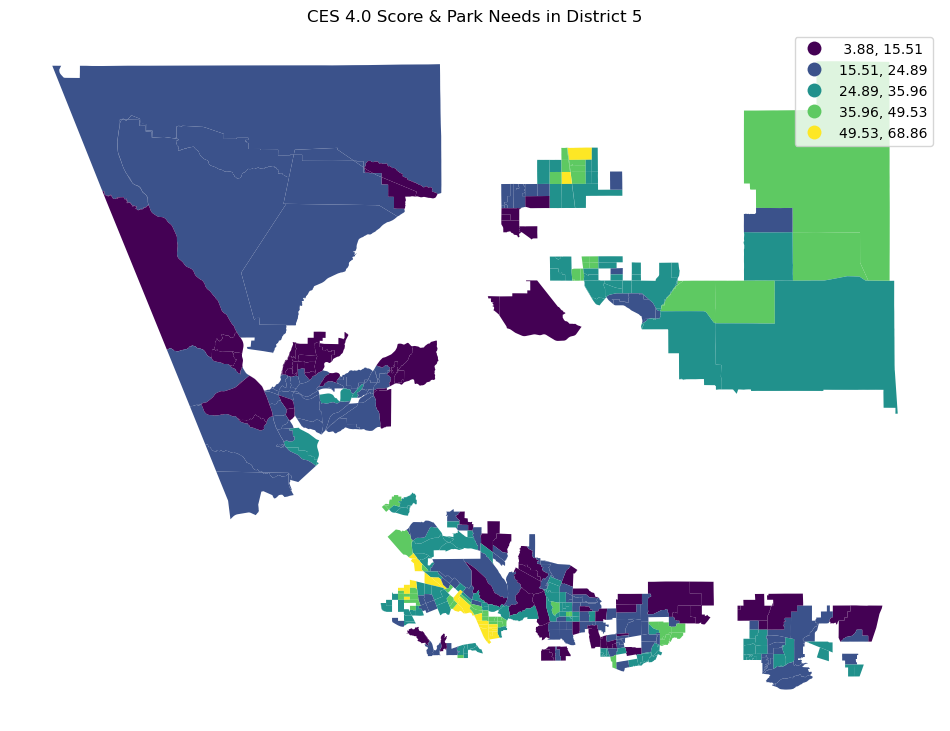

In [37]:
import matplotlib.pyplot as plt
ax5= pna_locations.plot(figsize=(12,10),
                            column='CES 4.0 Score',
                 legend=True, 
                 scheme='NaturalBreaks')
ax5.set_title('CES 4.0 Score & Park Needs in District 5')
ax5.axis('off')
plt.show()

In [38]:
from shapely.geometry import Polygon
import geopandas as gpd

pna_locations2 = gpd.overlay(district2ces, pna, how='intersection', keep_geom_type=False, make_valid=True)

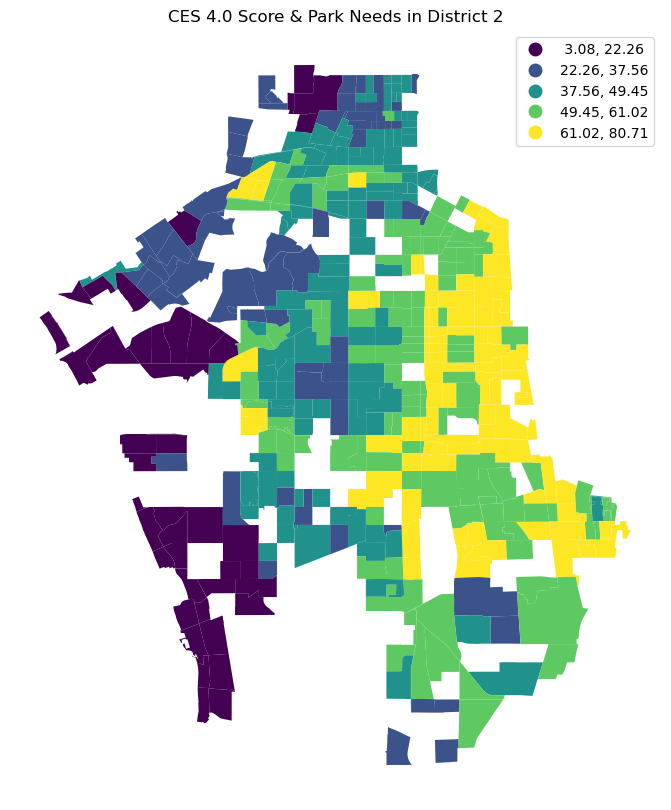

In [39]:
ax2 = pna_locations2.plot(figsize=(12,10),
                            column='CES 4.0 Score',
                 legend=True, 
                 scheme='NaturalBreaks')
ax2.set_title('CES 4.0 Score & Park Needs in District 2')
ax2.axis('off')
plt.show()

In [40]:
district5tracts = pna_locations.merge(district5, on='FIPS', how='inner')

In [41]:
import pandas as pd
district5tracts['NEED_DESCP'] = pd.to_numeric(district5tracts['NEED_DESCP'], errors='coerce')

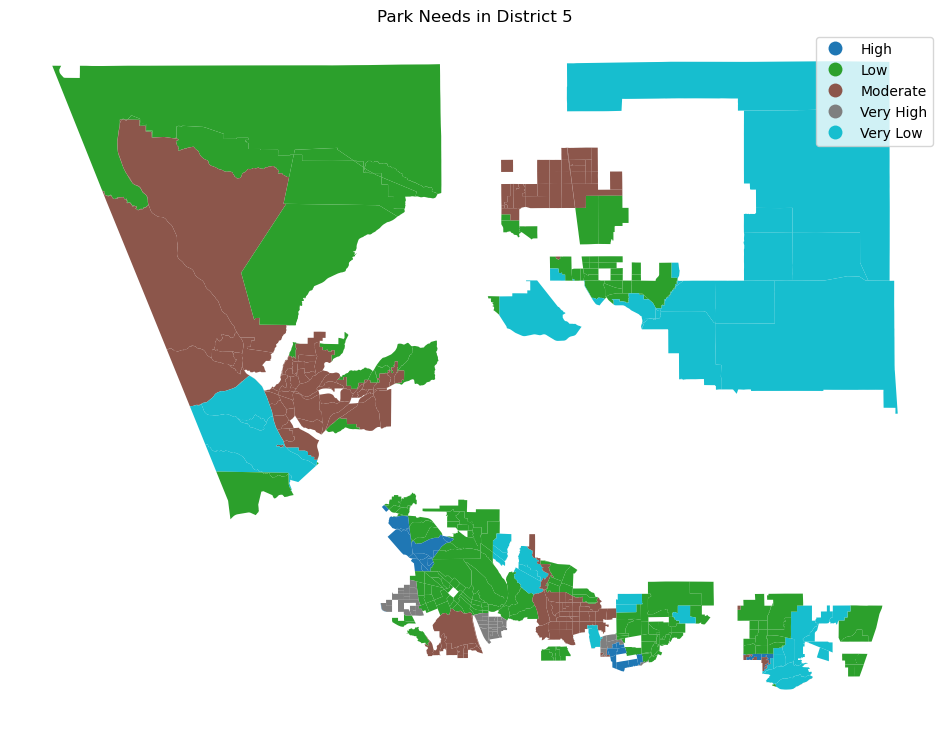

In [42]:
import matplotlib.pyplot as plt
ax50= pna_locations.plot(figsize=(12,10),
                            column='NEED_DESCP',
                 legend=True, 
                 )
ax50.set_title('Park Needs in District 5')
ax50.axis('off')
plt.show()

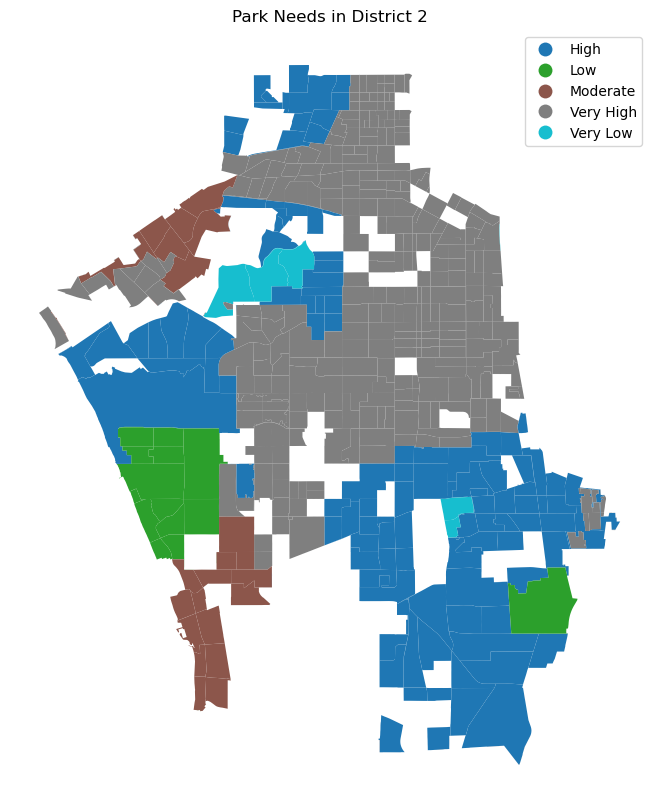

In [43]:
import matplotlib.pyplot as plt
ax52= pna_locations2.plot(figsize=(12,10),
                            column='NEED_DESCP',
                 legend=True, 
                 )
ax52.set_title('Park Needs in District 2')
ax52.axis('off')
plt.show()

In [45]:
import folium

In [47]:
p = folium.Map(location=[34.051850, -118.243322], tiles=None)

folium.raster_layers.TileLayer(
    location=[34.051850, -118.243322],
    tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
    attr='Mapbox',
    API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
    name='Monochrome',
    zoom_start=9  
).add_to(p)

folium.Choropleth(
   geo_data= district2ces, 
    data= district2ces,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'CES 4.0 Score'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2,
                  legend_name='CES 4.0 Score').add_to(p) 


In [48]:
p.save('sd2_ces.html')

In [50]:
hjm = folium.Map(location=[34.051850, -118.243322], tiles=None)

folium.raster_layers.TileLayer(
    location=[34.051850, -118.243322],
    tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
    attr='Mapbox',
    API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
    name='Monochrome',
    zoom_start=9  
).add_to(hjm)

folium.Choropleth(
   geo_data= district5ces, 
    data= district5ces,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'CES 4.0 Score'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2,
                  legend_name='CES 4.0 Score').add_to(hjm) 


In [51]:
hjm.save('sd5_ces.html')

Notebook is cleaned now onto the next step

# Step 2: Add a function and a loop

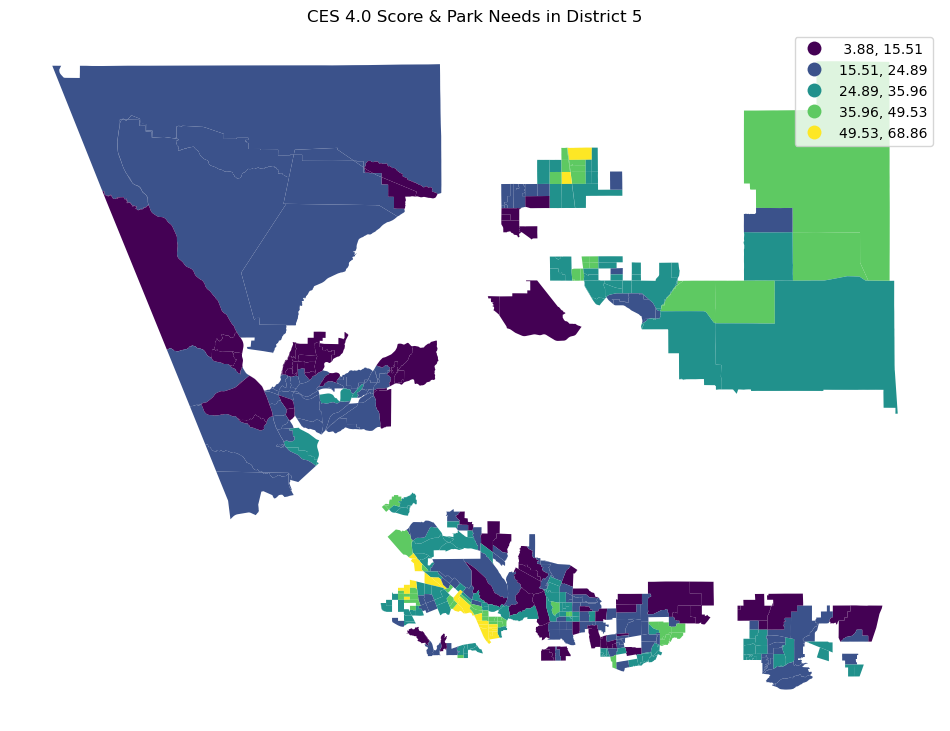

In [53]:
import matplotlib.pyplot as plt

# Defining the function to plot CES 4.0 Score and Park Needs
def plot_ces_and_park_needs(data, column, title):
    ax = data.plot(figsize=(12, 10),
                   column=column,
                   legend=True,
                   scheme='NaturalBreaks')
    ax.set_title(title)
    ax.axis('off')
    plt.show()

plot_ces_and_park_needs(data=pna_locations, column='CES 4.0 Score', title='CES 4.0 Score & Park Needs in District 5')

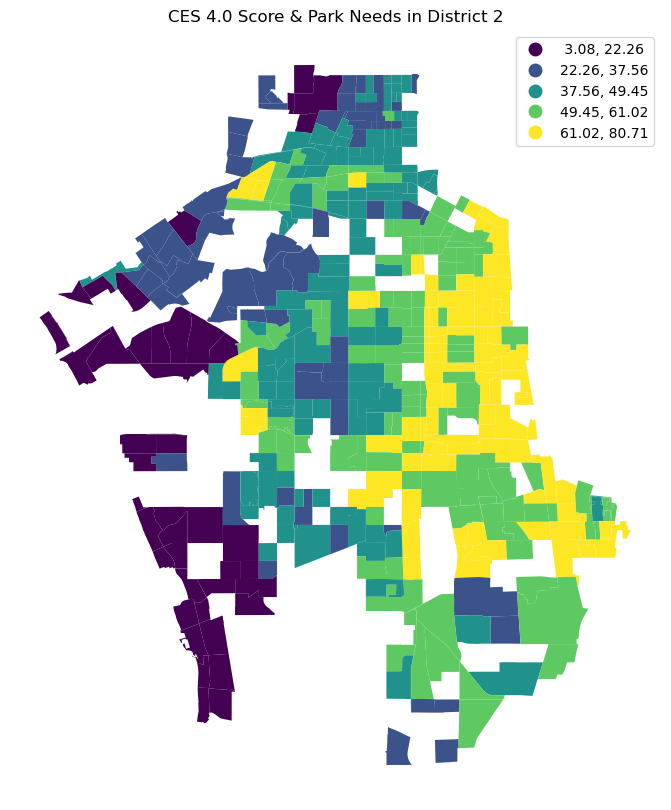

In [55]:
# Now for District 2
plot_ces_and_park_needs(data=pna_locations2, column='CES 4.0 Score', title='CES 4.0 Score & Park Needs in District 2')

In [57]:
# trying function for folium
import folium

# Defining the function to plot CES 4.0 Score and Park Needs using Folium
def plot_ces_and_park_needs_folium(data, geo_data, column, title):
    p = folium.Map(location=[34.051850, -118.243322], tiles=None)
    
    folium.raster_layers.TileLayer(
        location=[34.051850, -118.243322],
        tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        attr='Mapbox',
        API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        name='Monochrome',
        zoom_start=9  
    ).add_to(p)

    folium.Choropleth(
       geo_data= geo_data, 
        data= data,         
        key_on='feature.properties.FIPS', 
        columns=['FIPS', column], 
        fill_color='BuPu',
        line_weight=0.1, 
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name=title
    ).add_to(p) 
    
    return p
function_folium_map_1 = plot_ces_and_park_needs_folium(data=district2ces, geo_data=district2ces, column='CES 4.0 Score', title='CES 4.0 Score & Park Needs in District 2')

# Display the map
function_folium_map_1

In [58]:
import folium

# Defining the function to plot CES 4.0 Score and Park Needs using Folium for D5
def plot_ces_and_park_needs_folium(data, geo_data, column, title):
    hjm = folium.Map(location=[34.051850, -118.243322], tiles=None)
    
    folium.raster_layers.TileLayer(
        location=[34.051850, -118.243322],
        tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        attr='Mapbox',
        API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        name='Monochrome',
        zoom_start=9  
    ).add_to(hjm)

    folium.Choropleth(
       geo_data= geo_data, 
        data= data,         
        key_on='feature.properties.FIPS', 
        columns=['FIPS', column], 
        fill_color='BuPu',
        line_weight=0.1, 
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name=title
    ).add_to(hjm) 
    
    return hjm
hjm_map = plot_ces_and_park_needs_folium(data=district5ces, geo_data=district5ces, column='CES 4.0 Score', title='CES 4.0 Score & Park Needs in District 5')

# Display the map
hjm_map


In [64]:
import folium

# Defining the function to plot CES 4.0 Score and Park Needs using Folium
def plot_ces_and_park_needs_folium(data, geo_data, column, title):
    hjm = folium.Map(location=[34.051850, -118.243322], tiles=None)
    
    folium.raster_layers.TileLayer(
        location=[34.051850, -118.243322],
        tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        attr='Mapbox',
        API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        name='Monochrome',
        zoom_start=9  
    ).add_to(hjm)

    folium.Choropleth(
       geo_data= geo_data, 
        data= data,         
        key_on='feature.properties.FIPS', 
        columns=['FIPS', column], 
        fill_color='BuPu',
        line_weight=0.1, 
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name=title
    ).add_to(hjm) 
    
    return hjm

# District 2/5 with their data
districts = [('District 2', district2ces), ('District 5', district5ces)]

# Maps of each district
for district_name, district_geo_data in districts:
    hjm_map = plot_ces_and_park_needs_folium(data=district_geo_data, geo_data=district_geo_data, column='CES 4.0 Score', title=f'CES 4.0 Score & Park Needs in {district_name}')
    
    # Display the map
    display(hjm_map)


generated the folium maps in one function. now going to place both folium's in one map

In [66]:
import folium
from folium import Choropleth

# Defining the function to plot CES 4.0 Score and Park Needs using Folium
def plot_ces_and_park_needs_folium(data_list, column_list, title):
    D2_5 = folium.Map(location=[34.051850, -118.243322], tiles=None)

    folium.raster_layers.TileLayer(
        location=[34.051850, -118.243322],
        tiles='https://api.mapbox.com/styles/v1/cgiamarino/ckh3zcblc09pp19n0adewnboh/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        attr='Mapbox',
        API_key='pk.eyJ1IjoiY2dpYW1hcmlubyIsImEiOiJjanAyd2hwNWUwYnJ3M3dzMHF4MnJkZ29uIn0.7tLnplw65tLmywvvIPGSKA',
        name='Monochrome',
        zoom_start=9
    ).add_to(D2_5)

    for data, column in zip(data_list, column_list):
        Choropleth(
            geo_data=data,
            data=data,
            key_on='feature.properties.FIPS',
            columns=['FIPS', column],
            fill_color='BuPu',
            line_weight=0.1,
            fill_opacity=0.8,
            line_opacity=0.2,
            legend_name=title
        ).add_to(D2_5)

    return D2_5

# District 2/5 with their data
districts = [('District 2', district2ces),
             ('District 5', district5ces)]

# data and column from the districts list
data_list = [district[1] for district in districts]
column_list = ['CES 4.0 Score' for _ in range(len(districts))]  # Assuming 'CES 4.0 Score' is the column name for all districts

# making one map
D2_5_map = plot_ces_and_park_needs_folium(data_list, column_list, title='D2_5')

# Display the map
D2_5_map
